In [7]:
!pip install pandas
!pip install seaborn
!pip install matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 8.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 881.3 kB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 4.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.4/38.4 MB 1.1 MB/s eta 0:00:0000:0100:010m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.1/159.1 kB 1.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 21.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 2.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.4/313.4 kB 2.1 MB/s eta 0:00:00a 0:00:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 2.6 MB/s eta 0:00:0000:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 1.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 748.2 kB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from phik.report import plot_correlation_matrix


In [63]:
test = pd.read_csv('test.csv')
train = pd.read_csv('train.csv')

In [5]:
test

,session_id,site1,time1,site2,time2,site3,time3,site4,time4,site5,...,site6,time6,site7,time7,site8,time8,site9,time9,site10,time10
0,1,29,2014-10-04,35,2014-10-04,22,2014-10-04,321,2014-10-04,23,...,2211,2014-10-04,6730,2014-10-04,21,2014-10-04,44582,2014-10-04,15336,2014-10-04
1,2,782,2014-07-03,782,2014-07-03,782,2014-07-03,782,2014-07-03,782,...,782,2014-07-03,782,2014-07-03,782,2014-07-03,782,2014-07-03,782,2014-07-03
2,3,55,2014-12-05,55,2014-12-05,55,2014-12-05,55,2014-12-05,55,...,55,2014-12-05,55,2014-12-05,55,2014-12-05,1445,2014-12-05,1445,2014-12-05
3,4,1023,2014-11-04,1022,2014-11-04,50,2014-11-04,222,2014-11-04,202,...,3374,2014-11-04,50,2014-11-04,48,2014-11-04,48,2014-11-04,3374,2014-11-04
4,5,301,2014-05-16,301,2014-05-16,301,2014-05-16,66,2014-05-16,67,...,69,2014-05-16,70,2014-05-16,68,2014-05-16,71,2014-05-16,167,2014-05-16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82792,82793,812,2014-10-02,1039,2014-10-02,676,2014-10-02,3,2014-05-27,167,...,45064,2014-05-27,45065,2014-05-27,384,2014-05-27,23,2014-05-27,3346,2014-05-27
82793,82794,300,2014-05-26,302,2014-05-26,302,2014-05-26,300,2014-05-26,300,...,1222,2014-05-26,302,2014-05-26,1218,2014-05-26,1221,2014-05-26,1216,2014-05-26
82794,82795,29,2014-05-02,33,2014-05-02,35,2014-05-02,22,2014-05-02,37,...,6779,2014-05-02,30,2014-05-02,21,2014-05-02,23,2014-05-02,6780,2014-05-02
82795,82796,5828,2014-05-03,23,2014-05-03,21,2014-05-03,804,2014-05-03,21,...,3350,2014-05-03,23,2014-05-03,894,2014-05-03,21,2014-05-03,961,2014-05-03


In [ ]:
train

In [86]:
full_df = pd.concat([train.drop('target', axis=1), test])

# 2.1 Визуальный анализ данных

In [15]:

# Напишем функцию, которая принимает на вход DataFrame, кодирует числовыми значениями категориальные признаки
# и возвращает обновленный DataFrame и сами кодировщики.
def number_encode_features(init_df):
    result = init_df.copy() # копируем нашу исходную таблицу
    encoders = {}
    for column in result.columns:
        if result.dtypes[column] == object: # np.object -- строковый тип / если тип столбца - строка, то нужно его закодировать
            encoders[column] = preprocessing.LabelEncoder() # для колонки column создаем кодировщик
            result[column] = encoders[column].fit_transform(result[column]) # применяем кодировщик к столбцу и перезаписываем столбец
    return result, encoders

encoded_full, encoders = number_encode_features(full_df) # Теперь encoded data содержит закодированные кат. признаки
encoded_full.head()

,session_id,site1,time1,site2,time2,site3,time3,site4,time4,site5,...,site6,time6,site7,time7,site8,time8,site9,time9,site10,time10
0,2,890,80,941,79,3847,79,941,78,942,...,3846,78,3847,78,3846,78,1516,78,1518,78
1,3,14769,31,39,31,14768,31,14769,31,37,...,39,31,14768,31,14768,31,14768,31,14768,31
2,4,782,106,782,105,782,104,782,103,782,...,782,103,782,103,782,103,782,103,782,103
3,5,22,86,177,85,175,85,178,84,177,...,178,84,175,84,177,84,177,84,178,84
4,6,570,96,21,95,570,94,21,93,21,...,178,84,175,84,177,84,177,84,178,84


будем использовать визализацию Корреляция признаков по этой визуализации можно увидеть как признаки зависимы друг от друга

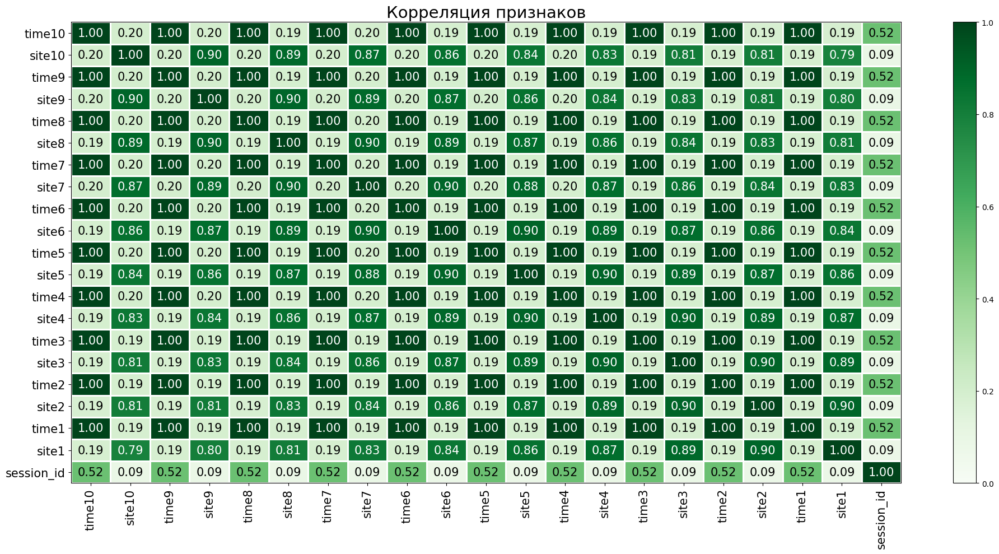

In [16]:
features_target = encoded_full
interval_cols = encoded_full
phik_overview = features_target.phik_matrix(interval_cols=interval_cols)

plot_correlation_matrix(phik_overview.values,
                        x_labels=phik_overview.columns,
                        y_labels=phik_overview.index,
                        vmin=0, vmax=1, color_map="Greens",
                        title="Корреляция признаков",
                        fontsize_factor=1.5,
                        figsize=(20, 10))
plt.tight_layout()



и по этой визуализации видно что время все время зависимо друг от друга, а сайты не сильно зависимы друг от друга.

Далее будем использовать визуализацию ящик с усами она может показать как данные зависимы и как они разбросанны

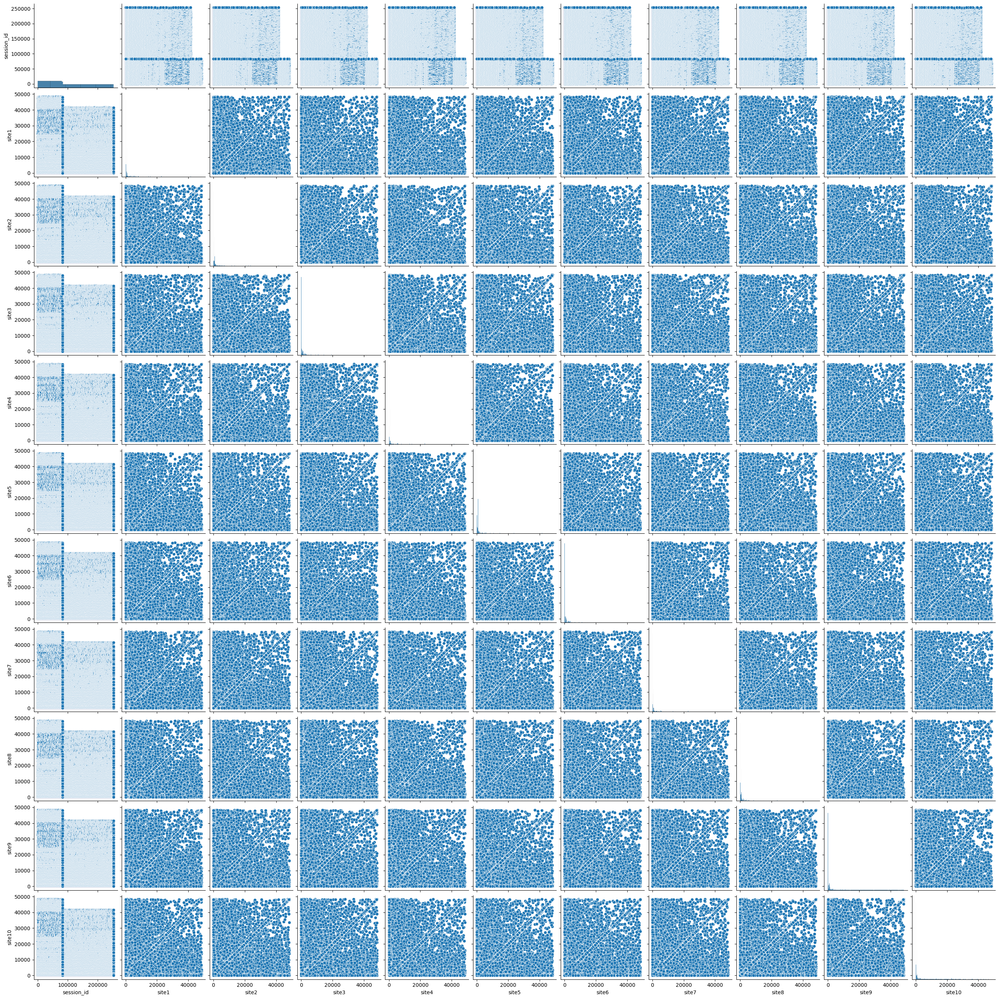

In [21]:

sns_plot = sns.pairplot(full_df)
sns_plot.savefig('pairplot.png')

Из данной визуализации видно что данные ОЧЕНЬ очень сильно расбросанны 

далее визулизация displot она может показать зависимость данных в другом виде

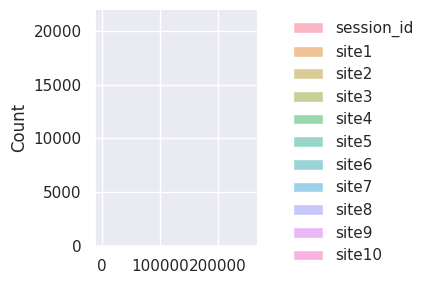

In [23]:

sns.set_theme(style="darkgrid")
df = full_df
sns.displot(
    df,
    binwidth=3, height=3, facet_kws=dict(margin_titles=True),
)


По данной визуализации видно сильно много по сравнению с другой визуализацией

# 2.2 Конструирование признаков (Feature Engineering)

In [34]:
full_df

,session_id,site1,time1,site2,time2,site3,time3,site4,time4,site5,...,site6,time6,site7,time7,site8,time8,site9,time9,site10,time10
0,2,890,2014-02-22,941,2014-02-22,3847,2014-02-22,941,2014-02-22,942,...,3846,2014-02-22,3847,2014-02-22,3846,2014-02-22,1516,2014-02-22,1518,2014-02-22
1,3,14769,2013-12-16,39,2013-12-16,14768,2013-12-16,14769,2013-12-16,37,...,39,2013-12-16,14768,2013-12-16,14768,2013-12-16,14768,2013-12-16,14768,2013-12-16
2,4,782,2014-03-28,782,2014-03-28,782,2014-03-28,782,2014-03-28,782,...,782,2014-03-28,782,2014-03-28,782,2014-03-28,782,2014-03-28,782,2014-03-28
3,5,22,2014-02-28,177,2014-02-28,175,2014-02-28,178,2014-02-28,177,...,178,2014-02-28,175,2014-02-28,177,2014-02-28,177,2014-02-28,178,2014-02-28
4,6,570,2014-03-18,21,2014-03-18,570,2014-03-18,21,2014-03-18,21,...,178,2014-02-28,175,2014-02-28,177,2014-02-28,177,2014-02-28,178,2014-02-28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82792,82793,812,2014-10-02,1039,2014-10-02,676,2014-10-02,3,2014-05-27,167,...,45064,2014-05-27,45065,2014-05-27,384,2014-05-27,23,2014-05-27,3346,2014-05-27
82793,82794,300,2014-05-26,302,2014-05-26,302,2014-05-26,300,2014-05-26,300,...,1222,2014-05-26,302,2014-05-26,1218,2014-05-26,1221,2014-05-26,1216,2014-05-26
82794,82795,29,2014-05-02,33,2014-05-02,35,2014-05-02,22,2014-05-02,37,...,6779,2014-05-02,30,2014-05-02,21,2014-05-02,23,2014-05-02,6780,2014-05-02
82795,82796,5828,2014-05-03,23,2014-05-03,21,2014-05-03,804,2014-05-03,21,...,3350,2014-05-03,23,2014-05-03,894,2014-05-03,21,2014-05-03,961,2014-05-03


убираем '-' из данных в колонках 'time'

In [87]:
full_df['time1'] = full_df['time1'].str.replace('-', ' ')
full_df['time2'] = full_df['time2'].str.replace('-', ' ')
full_df['time3'] = full_df['time3'].str.replace('-', ' ')
full_df['time4'] = full_df['time4'].str.replace('-', ' ')
full_df['time5'] = full_df['time5'].str.replace('-', ' ')
full_df['time6'] = full_df['time6'].str.replace('-', ' ')
full_df['time7'] = full_df['time7'].str.replace('-', ' ')
full_df['time8'] = full_df['time8'].str.replace('-', ' ')
full_df['time9'] = full_df['time9'].str.replace('-', ' ')
full_df['time10'] = full_df['time10'].str.replace('-', ' ')
full_df

,session_id,site1,time1,site2,time2,site3,time3,site4,time4,site5,...,site6,time6,site7,time7,site8,time8,site9,time9,site10,time10
0,2,890,2014 02 22,941,2014 02 22,3847,2014 02 22,941,2014 02 22,942,...,3846,2014 02 22,3847,2014 02 22,3846,2014 02 22,1516,2014 02 22,1518,2014 02 22
1,3,14769,2013 12 16,39,2013 12 16,14768,2013 12 16,14769,2013 12 16,37,...,39,2013 12 16,14768,2013 12 16,14768,2013 12 16,14768,2013 12 16,14768,2013 12 16
2,4,782,2014 03 28,782,2014 03 28,782,2014 03 28,782,2014 03 28,782,...,782,2014 03 28,782,2014 03 28,782,2014 03 28,782,2014 03 28,782,2014 03 28
3,5,22,2014 02 28,177,2014 02 28,175,2014 02 28,178,2014 02 28,177,...,178,2014 02 28,175,2014 02 28,177,2014 02 28,177,2014 02 28,178,2014 02 28
4,6,570,2014 03 18,21,2014 03 18,570,2014 03 18,21,2014 03 18,21,...,178,2014 02 28,175,2014 02 28,177,2014 02 28,177,2014 02 28,178,2014 02 28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82792,82793,812,2014 10 02,1039,2014 10 02,676,2014 10 02,3,2014 05 27,167,...,45064,2014 05 27,45065,2014 05 27,384,2014 05 27,23,2014 05 27,3346,2014 05 27
82793,82794,300,2014 05 26,302,2014 05 26,302,2014 05 26,300,2014 05 26,300,...,1222,2014 05 26,302,2014 05 26,1218,2014 05 26,1221,2014 05 26,1216,2014 05 26
82794,82795,29,2014 05 02,33,2014 05 02,35,2014 05 02,22,2014 05 02,37,...,6779,2014 05 02,30,2014 05 02,21,2014 05 02,23,2014 05 02,6780,2014 05 02
82795,82796,5828,2014 05 03,23,2014 05 03,21,2014 05 03,804,2014 05 03,21,...,3350,2014 05 03,23,2014 05 03,894,2014 05 03,21,2014 05 03,961,2014 05 03


разделяем данные на несколько колонок

In [88]:
full_df['timef1'] = full_df['time1'].apply(lambda x: x.split()[0])
full_df['timea1'] = full_df['time1'].apply(lambda x: x.split()[1])
full_df['timef2'] = full_df['time2'].apply(lambda x: x.split()[0])
full_df['timea2'] = full_df['time2'].apply(lambda x: x.split()[1])
full_df['timef3'] = full_df['time3'].apply(lambda x: x.split()[0])
full_df['timea3'] = full_df['time3'].apply(lambda x: x.split()[1])
full_df['timef4'] = full_df['time4'].apply(lambda x: x.split()[0])
full_df['timea4'] = full_df['time4'].apply(lambda x: x.split()[1])
full_df['timef5'] = full_df['time5'].apply(lambda x: x.split()[0])
full_df['timea5'] = full_df['time5'].apply(lambda x: x.split()[1])
full_df['timef6'] = full_df['time6'].apply(lambda x: x.split()[0])
full_df['timea6'] = full_df['time6'].apply(lambda x: x.split()[1])
full_df['timef7'] = full_df['time7'].apply(lambda x: x.split()[0])
full_df['timea7'] = full_df['time7'].apply(lambda x: x.split()[1])
full_df['timef8'] = full_df['time8'].apply(lambda x: x.split()[0])
full_df['timea8'] = full_df['time8'].apply(lambda x: x.split()[1])
full_df['timef9'] = full_df['time9'].apply(lambda x: x.split()[0])
full_df['timea9'] = full_df['time9'].apply(lambda x: x.split()[1])
full_df['timef10'] = full_df['time10'].apply(lambda x: x.split()[0])
full_df['timea10'] = full_df['time10'].apply(lambda x: x.split()[1])


full_df

,session_id,site1,time1,site2,time2,site3,time3,site4,time4,site5,...,timef6,timea6,timef7,timea7,timef8,timea8,timef9,timea9,timef10,timea10
0,2,890,2014 02 22,941,2014 02 22,3847,2014 02 22,941,2014 02 22,942,...,2014,02,2014,02,2014,02,2014,02,2014,02
1,3,14769,2013 12 16,39,2013 12 16,14768,2013 12 16,14769,2013 12 16,37,...,2013,12,2013,12,2013,12,2013,12,2013,12
2,4,782,2014 03 28,782,2014 03 28,782,2014 03 28,782,2014 03 28,782,...,2014,03,2014,03,2014,03,2014,03,2014,03
3,5,22,2014 02 28,177,2014 02 28,175,2014 02 28,178,2014 02 28,177,...,2014,02,2014,02,2014,02,2014,02,2014,02
4,6,570,2014 03 18,21,2014 03 18,570,2014 03 18,21,2014 03 18,21,...,2014,02,2014,02,2014,02,2014,02,2014,02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82792,82793,812,2014 10 02,1039,2014 10 02,676,2014 10 02,3,2014 05 27,167,...,2014,05,2014,05,2014,05,2014,05,2014,05
82793,82794,300,2014 05 26,302,2014 05 26,302,2014 05 26,300,2014 05 26,300,...,2014,05,2014,05,2014,05,2014,05,2014,05
82794,82795,29,2014 05 02,33,2014 05 02,35,2014 05 02,22,2014 05 02,37,...,2014,05,2014,05,2014,05,2014,05,2014,05
82795,82796,5828,2014 05 03,23,2014 05 03,21,2014 05 03,804,2014 05 03,21,...,2014,05,2014,05,2014,05,2014,05,2014,05


удаляем старые колонки

In [89]:
full_df = full_df.drop(['time1', 'time2', 'time3', 'time4', 'time5', 'time6', 'time7', 'time8', 'time9', 'time10'], axis= 1 ,)
full_df

,session_id,site1,site2,site3,site4,site5,site6,site7,site8,site9,...,timef6,timea6,timef7,timea7,timef8,timea8,timef9,timea9,timef10,timea10
0,2,890,941,3847,941,942,3846,3847,3846,1516,...,2014,02,2014,02,2014,02,2014,02,2014,02
1,3,14769,39,14768,14769,37,39,14768,14768,14768,...,2013,12,2013,12,2013,12,2013,12,2013,12
2,4,782,782,782,782,782,782,782,782,782,...,2014,03,2014,03,2014,03,2014,03,2014,03
3,5,22,177,175,178,177,178,175,177,177,...,2014,02,2014,02,2014,02,2014,02,2014,02
4,6,570,21,570,21,21,178,175,177,177,...,2014,02,2014,02,2014,02,2014,02,2014,02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82792,82793,812,1039,676,3,167,45064,45065,384,23,...,2014,05,2014,05,2014,05,2014,05,2014,05
82793,82794,300,302,302,300,300,1222,302,1218,1221,...,2014,05,2014,05,2014,05,2014,05,2014,05
82794,82795,29,33,35,22,37,6779,30,21,23,...,2014,05,2014,05,2014,05,2014,05,2014,05
82795,82796,5828,23,21,804,21,3350,23,894,21,...,2014,05,2014,05,2014,05,2014,05,2014,05


соеденяем колонки

In [92]:
full_df['time_s1'] = full_df['timef1'] + full_df['timea1']
full_df['time_s2'] = full_df['timef2'] + full_df['timea2']
full_df['time_s3'] = full_df['timef3'] + full_df['timea3']
full_df['time_s4'] = full_df['timef4'] + full_df['timea4']
full_df['time_s5'] = full_df['timef5'] + full_df['timea5']
full_df['time_s6'] = full_df['timef6'] + full_df['timea6']
full_df['time_s7'] = full_df['timef7'] + full_df['timea7']
full_df['time_s8'] = full_df['timef8'] + full_df['timea8']
full_df['time_s9'] = full_df['timef9'] + full_df['timea9']
full_df['time_s10'] = full_df['timef10'] + full_df['timea10']
full_df

,session_id,site1,site2,site3,site4,site5,site6,site7,site8,site9,...,time_s1,time_s2,time_s3,time_s4,time_s5,time_s6,time_s7,time_s8,time_s9,time_s10
0,2,890,941,3847,941,942,3846,3847,3846,1516,...,201402,201402,201402,201402,201402,201402,201402,201402,201402,201402
1,3,14769,39,14768,14769,37,39,14768,14768,14768,...,201312,201312,201312,201312,201312,201312,201312,201312,201312,201312
2,4,782,782,782,782,782,782,782,782,782,...,201403,201403,201403,201403,201403,201403,201403,201403,201403,201403
3,5,22,177,175,178,177,178,175,177,177,...,201402,201402,201402,201402,201402,201402,201402,201402,201402,201402
4,6,570,21,570,21,21,178,175,177,177,...,201403,201403,201403,201403,201403,201402,201402,201402,201402,201402
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82792,82793,812,1039,676,3,167,45064,45065,384,23,...,201410,201410,201410,201405,201405,201405,201405,201405,201405,201405
82793,82794,300,302,302,300,300,1222,302,1218,1221,...,201405,201405,201405,201405,201405,201405,201405,201405,201405,201405
82794,82795,29,33,35,22,37,6779,30,21,23,...,201405,201405,201405,201405,201405,201405,201405,201405,201405,201405
82795,82796,5828,23,21,804,21,3350,23,894,21,...,201405,201405,201405,201405,201405,201405,201405,201405,201405,201405


удаляем старые колонки

In [93]:
full_df = full_df.drop(['timef1', 'timef2', 'timef3', 'timef4', 'timef5', 'timef6', 'timef7', 'timef8', 'timef9', 'timef10','timea1', 'timea2', 'timea3', 'timea4', 'timea5', 'timea6', 'timea7', 'timea8', 'timea9', 'timea10'], axis= 1 ,)
full_df

,session_id,site1,site2,site3,site4,site5,site6,site7,site8,site9,...,time_s1,time_s2,time_s3,time_s4,time_s5,time_s6,time_s7,time_s8,time_s9,time_s10
0,2,890,941,3847,941,942,3846,3847,3846,1516,...,201402,201402,201402,201402,201402,201402,201402,201402,201402,201402
1,3,14769,39,14768,14769,37,39,14768,14768,14768,...,201312,201312,201312,201312,201312,201312,201312,201312,201312,201312
2,4,782,782,782,782,782,782,782,782,782,...,201403,201403,201403,201403,201403,201403,201403,201403,201403,201403
3,5,22,177,175,178,177,178,175,177,177,...,201402,201402,201402,201402,201402,201402,201402,201402,201402,201402
4,6,570,21,570,21,21,178,175,177,177,...,201403,201403,201403,201403,201403,201402,201402,201402,201402,201402
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82792,82793,812,1039,676,3,167,45064,45065,384,23,...,201410,201410,201410,201405,201405,201405,201405,201405,201405,201405
82793,82794,300,302,302,300,300,1222,302,1218,1221,...,201405,201405,201405,201405,201405,201405,201405,201405,201405,201405
82794,82795,29,33,35,22,37,6779,30,21,23,...,201405,201405,201405,201405,201405,201405,201405,201405,201405,201405
82795,82796,5828,23,21,804,21,3350,23,894,21,...,201405,201405,201405,201405,201405,201405,201405,201405,201405,201405


и смотрим на результат

In [94]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 336357 entries, 0 to 82796
Data columns (total 21 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   session_id  336357 non-null  int64 
 1   site1       336357 non-null  int64 
 2   site2       336357 non-null  int64 
 3   site3       336357 non-null  int64 
 4   site4       336357 non-null  int64 
 5   site5       336357 non-null  int64 
 6   site6       336357 non-null  int64 
 7   site7       336357 non-null  int64 
 8   site8       336357 non-null  int64 
 9   site9       336357 non-null  int64 
 10  site10      336357 non-null  int64 
 11  time_s1     336357 non-null  object
 12  time_s2     336357 non-null  object
 13  time_s3     336357 non-null  object
 14  time_s4     336357 non-null  object
 15  time_s5     336357 non-null  object
 16  time_s6     336357 non-null  object
 17  time_s7     336357 non-null  object
 18  time_s8     336357 non-null  object
 19  time_s9     336357 non-null  

данный признак был построен для учитывания помесячного линейного тренда за весь период предоставленных данных

# 2.3 Подготовка отчета

2.1 Визуальный анализ данных
- В результате этого задания были в визуализированны зависимости атрибутов в наборе
данных. Визуализация показала влияние атрибутов на целевую переменную, и данные были интерпретированны.
В результате первой визуализации были показаны зависимости данных, а в результате второй визуализации мы
увидели разброс данных

2.2 Конструирование признаков (Feature Engineering)
- В результате этого задания был создан признак, который будет представлять собой число вида ГГГГММ от той
даты, когда проходила сессия. Таким образом, мы будем учитывать помесячный линейный тренд за весь период предоставленных данных. Были добавлены
новые признаки, которые на мой взгляд позволят улучшить качество выбранной модели.
Была написанна функция для создания новых признаков.
Были описаны приемы генерации новых данных и результаты.
В результате этого были получены более 10 новых признаков времени
Признак time* был построен для учитывания помесячного линейного тренда за весь период предоставленных данных

2.3 Подготовка отчета
- В результате этого задания был создан отчет который показывает всю проделанную работу и результаты.